# <font color='orange'> Numerical Exercises 4 </font>

In this exercise we simulate a system of $ N_{part} = 108 $ Argon particles, whose interaction is described by a **Lennard-Jones** model, at equilibrium  in the **Microcanonical Ensamble NVE** via **Molecular Dynamics (MD)**, integrating the equations for the classical motion with the **Verlet algorithm**. This is a two-step method based on a simple third order Taylor expantion of the positions at times $ t+dt $ and $ t-dt $, which gives the following equation:

\begin{equation}
  \vec{r}(t+dt) = 2 \vec{r}(t) - \vec{r}(t-dt) + dt^2 \vec{a}(t)  \tag{$\star$}
  \label{eq:Verlet}
\end{equation}

Therefore it is not self-starting: initial positions $ \vec{r}(0) $ and velocities $ \vec{v}(0) $ of all the particles are not sufficient to begin a calculation; it is for this reason that, in the code initially provided, after reading the initial positions of the molecules from an appropriate file (<font face="Courier">config.0</font>), we have to prepare random velocities such that $ \vec{P}_{tot} = 0 $ for the center of mass of the system in order to avoid a drift motion, and restore the positions at time $ t-dt $ from them as

$$ \vec{r}(t-dt) = \vec{r}(t) - dt \vec{v}(t)$$

Having $ \vec{r}(t_{\vert_{t=0}}) $ and $ \vec{r}(t_{\vert_{t=0}} - dt) $ of all the Argon particles we can begin the actual MD simulation.


## <font color='blue'>Exercise 04.1</font>   
This first exercise consists in making an improvement to the starting strategy just described: MD simulations are in many respects very similar to real experiments and so we expect to have to equilibrate the system before taking measures on it, so that we can find results that relate to the true state of equilibrium we are interested in. One way to do this is to enable the possibility to restart the simulation reading not only an *actual* spatial configuration $ \big\{ \vec{r}_i(t) \big\}_{i=1}^{N_{part}}$ file but also an *old* spatial configuration $ \big\{ \vec{r}_i(t-dt) \big\}_{i=1}^{N_{part}} $ file (<font face="Courier">old.0</font>) generated in a previous run. <br>
Accordingly, I introduce a parameter that can take only two values: $ 0 $ corresponds to the random velocities initialization procedure provided in the initial code, $ 1 $ allows equilibrating instead.
In the latter case I read in the file <font face="Courier">old.0</font> the final $ \big\{ \vec{r}_i(t) \big\}_{i=1}^{N_{part}} $ and the penultimate $ \big\{ \vec{r}_i(t-dt) \big\}_{i=1}^{N_{part}}$ positions of the particles obtained from a previous complete simulation, and use them as starting points to apply the Verlet algorithm, thus generating the new positions $ \big\{ \vec{r}_i(t+dt) \big\}_{i=1}^{N_{part}} $ with equation \eqref{eq:Verlet} at the first step.<br>
Then I compute

$$ \vec{v}_i \Big(t+\frac{dt}{2} \Big) = \frac{\vec{r}_i(t+dt) - \vec{r}_i(t)}{dt} $$

for all the particles and extract the actual temperature as

$$ 
  T \Big( t+\frac{dt}{2} \Big) = \frac{1}{3} \ 
  \Big \langle \vec{v}^2 \Big(t+\frac{dt}{2} \Big) \Big \rangle
$$

I compare this temperature with the target temperature $ T^\star $ (the $^{\star}$ superscript refers to the use of LJ units $\sigma = \epsilon = m = 1$ for the (reduced) physical quantities) at which I study the system and extract a scaling factor 

$$ f_s = \sqrt{\frac{3 T^\star}{\langle {\vec{v}}^2 \rangle}} $$

for the velocities and rescale them $ \vec{v}_i(t) \rightarrow \vec{v}_{s,i}(t) = f_s \vec{v}_i(t) $.
I can finally calculate a novel old spatial configuration

$$ \vec{r}_{new, i}(t) = \vec{r}_i(t+dt) - dt \ \vec{v}_{s,i}(t) $$

I use $ \big\{ \vec{r}_{new,i}(t) \big\}_{i=1}^{N_{part}} $ and $ \big\{ \vec{r}_i(t+dt) \big\}_{i=1}^{N_{part}} $ to start the simulation of the dynamics of the particles which should be in a better state of equilibrium with respect to the target temperature.
It is obviously necessary to perform a first simulation using random velocities in order to be able to proceed with the *restart option*.<br>
The goal is to equilibrate a system of $ N_{part} $ particles of Argon interacting via a Lennard-Jones potential

$$ 
  V_{LJ}(r) = 4 \epsilon \ \bigg[ \bigg( \frac{\sigma}{r} \bigg)^{12} - 
  \ \ \bigg( \frac{\sigma}{r} \bigg)^6 \bigg]
$$

where $ r $ is the distance between two interacting particles, $ \epsilon $ is the depth of the potential well (the "dispersion energy"), and $ \sigma $ is the distance at which the particle-particle potential energy $ V_{LJ} $ is zero (the "size of the particle"), in three different conditions

1. *solid phase*: $ \rho^\star = 1.1 $, $ T^\star = 0.8 $ (cut-off radius: $ r_c = 2.2 $)
2. *liquid phase*: $ \rho^\star = 0.8 $, $ T^\star = 1.1 $ (cut-off radius: $ r_c = 2.5 $)
3. *gas phase*: $ \rho^\star = 0.05 $, $ T^\star = 1.2 $ (cut-off radius: $ r_c = 5.0 $)

and characterized by the following set of parameters

|  Parameter                   |  Symbol                   |  Value           |
|  :-------:                   |  :----:                   |  :---:           |
|  Time step                   |  $dt \ (fs) $             |  $ 1.08 $        |
|  Number of integration steps |  $N_{step}$               |  $ 10^5 $        |
|  Mass                        |  $m$ $(amu)$              |  $ 39 $.$ 948 $  |
|  LJ particle size            |  $\sigma \ (nm) $         |  $ 0.34 $        |
|  LJ dispersion energy        |  $\epsilon$ / $k_B$ $(K)$ |  $ 120 $         | 

I try to equilibrate all these phases, bringing the system to the target (reduced) temperature $ T^\star $, and I show my results herebelow.<br>
I plot the instantaneous values of $\dfrac{U^{\star}}{N}$, $\dfrac{K^{\star}}{N}$, and $T^{\star}$, whose calculation is already implemented in the released code, while trying to balance.<br>
Note that at this level I'm using only Lennard-Jones units of measure in the calculations, taking also $ k_B = 1 $.

<div class="alert alert-block alert-info">
 
  <b>Note:</b> <br>
  An important point in the construction of the simulation is the choice of the initial 
  coordinates of the molecules (<font face='Courier'>config.0</font>). In particular, it is 
  essential for the proper use of the Verlet algorithm to avoid starting with overlaps between molecules, which 
  could generate impulsive forces at the limit of the simulation, due to the divergent core part of the LJ 
  potential.<br>
  For this reason I choose to use as initial configuration for the solid phase that in which the atoms are 
  organized according to an *fcc lattice*. In contrast, I start both the liquid and the gaseous phase with the 
  last configuration generated in the simulation of the solid: it will be the task of the equilibration routine 
  to melt the system at the correct target temperature.
    
</div>

In [1]:
#Modules
from math import sqrt
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<a href="javascript:code_toggle()"> Show/Hide code cells </a>.''')

In [2]:
#In the case of single graphs in the figure
#I set the central alignment
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [3]:
######################################
#load the data
######################################
T_solid=0.8 #target temperature
            #solid phase
T_liquid=1.1 #target temperature
             #liquid phase
T_gas=1.2 #target temperature
          #gas phase

nsteps=10**5
t=np.linspace(1, nsteps, num=nsteps)

#Kinetic Energy
ekin_solid=np.loadtxt("04.1/solid/output_ekin.dat")
ekin_gas=np.loadtxt("04.1/gas/output_ekin.dat")
ekin_liquid=np.loadtxt("04.1/liquid/output_ekin.dat")

#Potential Energy
epot_solid=np.loadtxt("04.1/solid/output_epot.dat")
epot_liquid=np.loadtxt("04.1/liquid/output_epot.dat")
epot_gas=np.loadtxt("04.1/gas/output_epot.dat")

#Total Energy
etot_solid=np.loadtxt("04.1/solid/output_etot.dat")
etot_liquid=np.loadtxt("04.1/liquid/output_etot.dat")
etot_gas=np.loadtxt("04.1/gas/output_etot.dat")

#Temperature
temp_solid=np.loadtxt("04.1/solid/output_temp.dat")
temp_liquid=np.loadtxt("04.1/liquid/output_temp.dat")
temp_gas=np.loadtxt("04.1/gas/output_temp.dat")

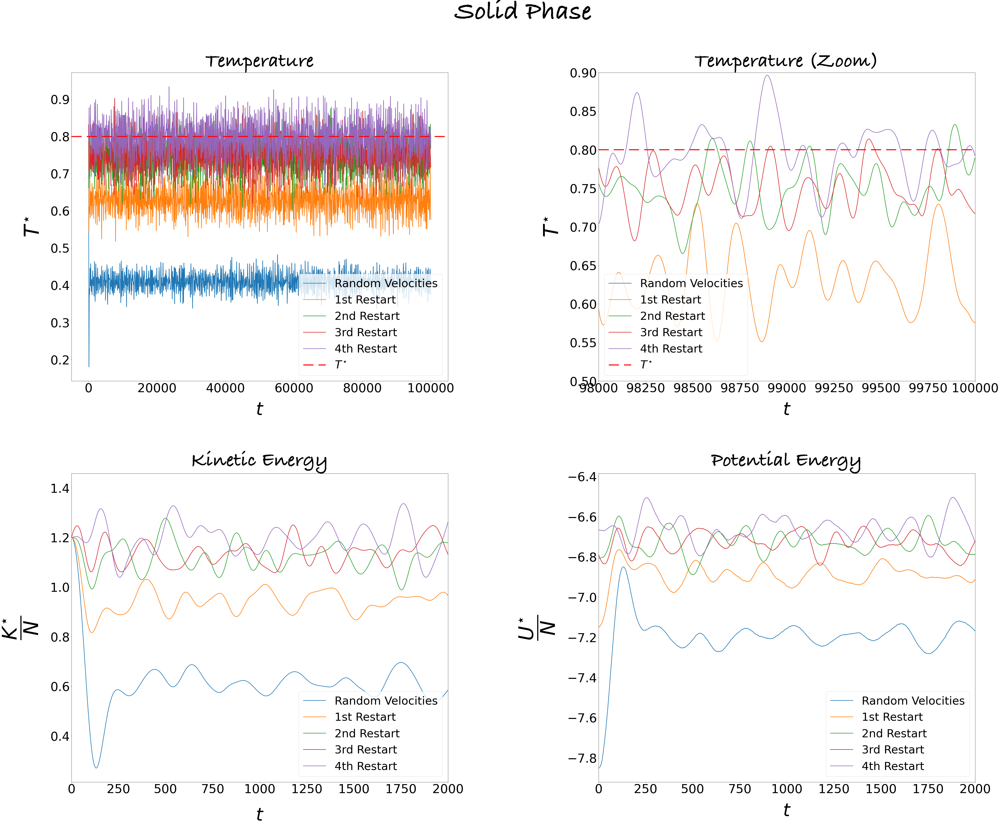

In [4]:
######################################
#plots
######################################
#Solid Phase
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Solid Phase', fontname = 'Bradley Hand', fontsize=120)

plt.subplot(2, 2, 1)
plt.title('Temperature', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, temp_solid[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, temp_solid[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, temp_solid[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, temp_solid[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t, temp_solid[4*nsteps:5*nsteps], linestyle='-', lw=2.5, label='4th Restart')
plt.axhline(y=T_solid, color='r', linewidth=4.5, linestyle='--', dashes=(10, 5), label='$ T^{\star} $')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$T^{\star}$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.legend(fontsize=50, loc='lower right')

plt.subplot(2, 2, 2)
plt.title('Temperature (Zoom)', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, temp_solid[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, temp_solid[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, temp_solid[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, temp_solid[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t, temp_solid[4*nsteps:5*nsteps], linestyle='-', lw=2.5, label='4th Restart')
plt.axhline(y=T_solid, color='r', linewidth=4.5, linestyle='--', dashes=(10, 5), label='$ T^{\star} $')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$T^{\star}$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.xlim(98000, 10**5)
plt.ylim(0.5, 0.9)
plt.legend(fontsize=50, loc='lower left')

plt.subplot(2, 2, 3)
plt.title('Kinetic Energy', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, ekin_solid[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, ekin_solid[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, ekin_solid[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, ekin_solid[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t, ekin_solid[4*nsteps:5*nsteps], linestyle='-', lw=2.5, label='4th Restart')
plt.xlabel('$t$', fontsize=80, labelpad=50)
plt.ylabel('$\dfrac{K^{\star}}{N}$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.xlim(0, 2000)
plt.legend(fontsize=50, loc='lower right')

plt.subplot(2, 2, 4)
plt.title('Potential Energy', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, epot_solid[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, epot_solid[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, epot_solid[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, epot_solid[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t, epot_solid[4*nsteps:5*nsteps], linestyle='-', lw=2.5, label='4th Restart')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{U^{\star}}{N}$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.xlim(0, 2000)
plt.legend(fontsize=50, loc='best')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

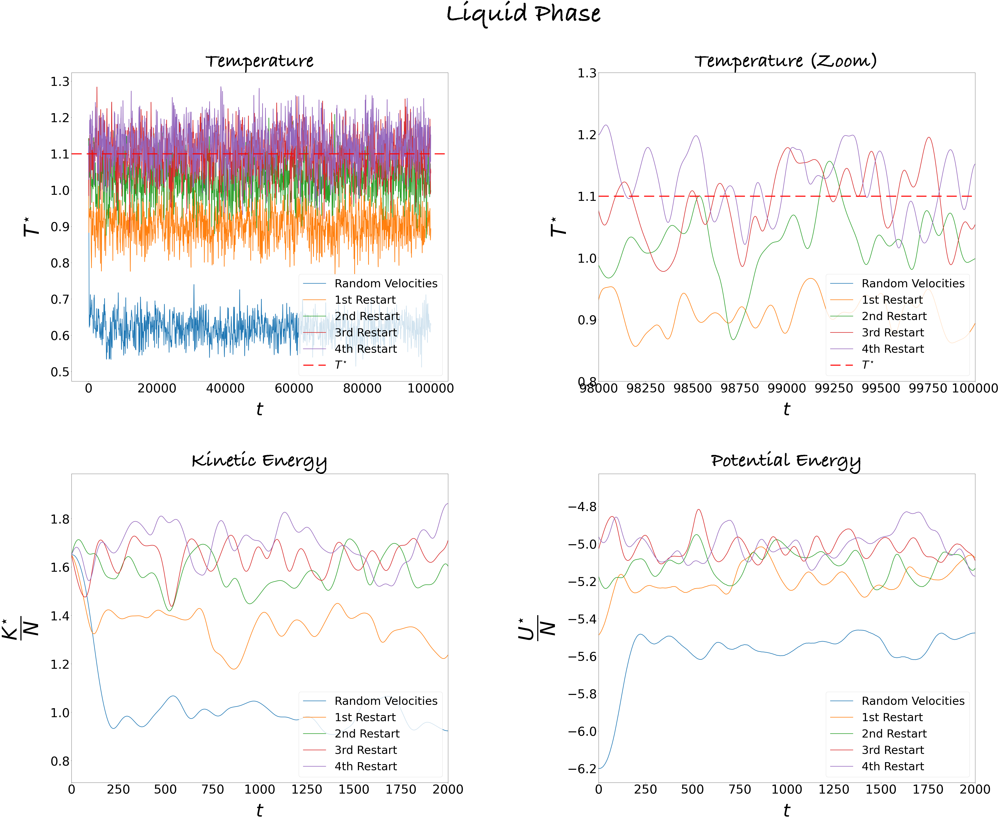

In [5]:
#Liquid Phase
print('\n\n')
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Liquid Phase', fontname = 'Bradley Hand', fontsize=120)

plt.subplot(2, 2, 1)
plt.title('Temperature', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, temp_liquid[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, temp_liquid[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, temp_liquid[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, temp_liquid[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t, temp_liquid[4*nsteps:5*nsteps], linestyle='-', lw=2.5, label='4th Restart')
plt.axhline(y=T_liquid, color='r', linewidth=4.5, linestyle='--', dashes=(10, 5), label='$ T^{\star} $')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$T^{\star}$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.legend(fontsize=50, loc='lower right')

plt.subplot(2, 2, 2)
plt.title('Temperature (Zoom)', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, temp_liquid[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, temp_liquid[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, temp_liquid[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, temp_liquid[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t, temp_liquid[4*nsteps:5*nsteps], linestyle='-', lw=2.5, label='4th Restart')
plt.axhline(y=T_liquid, color='r', linewidth=4.5, linestyle='--', dashes=(10, 5), label='$ T^{\star} $')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$T^{\star}$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.xlim(98000, 10**5)
plt.ylim(0.8, 1.3)
plt.legend(fontsize=50, loc='lower right')

plt.subplot(2, 2, 3)
plt.title('Kinetic Energy', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, ekin_liquid[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, ekin_liquid[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, ekin_liquid[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, ekin_liquid[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t, ekin_liquid[4*nsteps:5*nsteps], linestyle='-', lw=2.5, label='4th Restart')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{K^{\star}}{N}$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.xlim(0, 2000)
plt.legend(fontsize=50, loc='lower right')

plt.subplot(2, 2, 4)
plt.title('Potential Energy', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, epot_liquid[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, epot_liquid[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, epot_liquid[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, epot_liquid[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t, epot_liquid[4*nsteps:5*nsteps], linestyle='-', lw=2.5, label='4th Restart')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{U^{\star}}{N}$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.xlim(0, 2000)
plt.legend(fontsize=50, loc='best')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

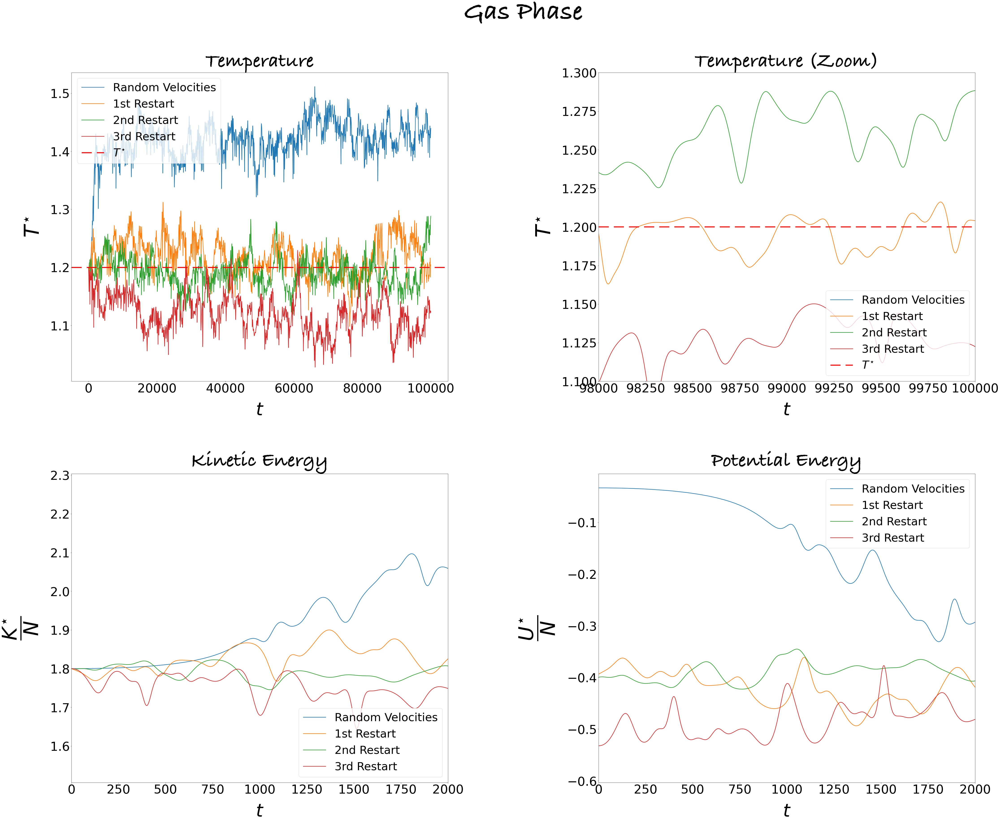

In [6]:
#Gas Phase
print('\n\n')
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Gas Phase', fontname = 'Bradley Hand', fontsize=120)

plt.subplot(2, 2, 1)
plt.title('Temperature', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, temp_gas[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, temp_gas[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, temp_gas[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, temp_gas[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.axhline(y=T_gas, color='r', linewidth=4.5, linestyle='--', dashes=(10, 5), label='$ T^{\star} $')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$T^{\star}$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.legend(fontsize=50, loc='best')

plt.subplot(2, 2, 2)
plt.title('Temperature (Zoom)', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, temp_gas[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, temp_gas[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, temp_gas[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, temp_gas[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.axhline(y=T_gas, color='r', linewidth=4.5, linestyle='--', dashes=(10, 5), label='$ T^{\star} $')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$T^{\star}$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.xlim(98000, 10**5)
plt.ylim(1.1, 1.3)
plt.legend(fontsize=50, loc='lower right')

plt.subplot(2, 2, 3)
plt.title('Kinetic Energy', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, ekin_gas[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, ekin_gas[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, ekin_gas[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, ekin_gas[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{K^{\star}}{N}$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.xlim(0, 2000)
plt.legend(fontsize=50, loc='lower right')

plt.subplot(2, 2, 4)
plt.title('Potential Energy', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t, epot_gas[0:nsteps], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t, epot_gas[nsteps:2*nsteps], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t, epot_gas[2*nsteps:3*nsteps], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t, epot_gas[3*nsteps:4*nsteps], linestyle='-', lw=2.5, label='3rd Restart')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{U^{\star}}{N}$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.xlim(0, 2000)
plt.legend(fontsize=50, loc='best')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

From the graphs above it is clear that it is sufficient to make a single restart to remove the initial "stair" in the observable curves of the three phases (I show only some portions of the curves compared to the total of the calculated instantaneous values, except for the first figures relating to the temperature of each phase). <br>
However, looking at the temperature plots, I distinguish the following two behaviors: the solid and the liquid phase approach the reference temperature (<font color='red'>red dashed line</font>) after the second (<font color='green'>green solid line</font>) or, even better, the third (<font color='red'>red solid line</font>) restart; whereas in the gas phase the system would appear to immediately reach the equilibrium after the first restart (<font color='orange'>orange solid line</font>), and then move away from it by restarting a third time (<font color='red'>red solid line</font>). <br>
For this reason I will carry out three and one runs, in the case of solid-liquid and gaseous phases respectively, to be sure to begin from an initial configuration at equilibrium, before starting with the actual measurements of the quantities of interest.

## <font color='blue'>Exercise 04.2</font>
Each of the observables we measure during this simulation is strongly correlated in time: in fact this is calculated from the classic solution of motion, i.e. by solving the Newton equations, which depends by definition on the solution found at earlier times during the integration. In relation to this exercise, the configurations are obtained through a Molecular Dynamics technique that exploits the Verlet algorithm, which requires the positions at times $ t $ and $ t-dt $ to generate the new ones at time $ t+dt $.
Consequently, the blocking method, that was not indispensable in the exercises that we have faced previously, plays an essential role in the correct computation of the average values and, in particular, of the statistical uncertainties for $ \dfrac{E}{N} $, $ \dfrac{U}{N} $, $ \dfrac{K}{N} $ and $ T $. 

Therefore, I implement the blocks average in the provided code, dividing the total $ N_{step} $ into $ N_{blk}=100 $ blocks.

## <font color='blue'>Exercise 04.3</font>
Now that all the required improvements have been made, I proceed with the actual simulation of the Lennard-Jones model of Argon in the three phases listed above.
In each of these I equilibrate the system as indicated at the end of <font color='blue'>Exercise 04.1</font> in order to start as close as possible to the target temperature.<br> 
I decide to calculate only the instantaneous values of the observables during the equilibration phase, and only after that I estimate the various quantities with the blocks average. Because of that, I add a boolean parameter in the <font face='Courier'>input.dat</font> file, named **blocking**, through which I choose whether to apply or not the blocking method.<br>
In these final simulations I restore **SI units** as required. <br>
I recall that $ N_{step} = 10^5 $ and $ N_{blk} = 10^2 $.

In [7]:
######################################
#load the data
######################################
#Units of measure
#LJ --> SI
SIGMA=0.34*10**(-9)  #[𝜎] = m unit of length
EPS=120  #[𝜖/𝑘b] = K unit of temperature
Kb=1.38064852*10**(-23)  #[Kb] = m^2 kg s^(-2) K^(-1)
M=6.6335209*10**(-26)  #[m] = kg --> m=39.948 amu
unit_of_energy=EPS*Kb;  #Joule [J]
unit_of_time=SIGMA*sqrt(M/unit_of_energy);  #seconds [s]
unit_of_pressure=unit_of_energy/(SIGMA**3);  #Pascal [Pa]

N_blk = np.arange(1, 101)

solid_epot, solid_err_epot=np.loadtxt("04.3/solid/ave_epot.dat", usecols=(0,1), unpack=True)
solid_ekin, solid_err_ekin=np.loadtxt("04.3/solid/ave_ekin.dat", usecols=(0,1), unpack=True)
solid_etot, solid_err_etot=np.loadtxt("04.3/solid/ave_etot.dat", usecols=(0,1), unpack=True)
solid_temp, solid_err_temp=np.loadtxt("04.3/solid/ave_temp.dat", usecols=(0,1), unpack=True)

liquid_epot, liquid_err_epot=np.loadtxt("04.3/liquid/ave_epot.dat", usecols=(0,1), unpack=True)
liquid_ekin, liquid_err_ekin=np.loadtxt("04.3/liquid/ave_ekin.dat", usecols=(0,1), unpack=True)
liquid_etot, liquid_err_etot=np.loadtxt("04.3/liquid/ave_etot.dat", usecols=(0,1), unpack=True)
liquid_temp, liquid_err_temp=np.loadtxt("04.3/liquid/ave_temp.dat", usecols=(0,1), unpack=True)

gas_epot, gas_err_epot=np.loadtxt("04.3/gas/ave_epot.dat", usecols=(0,1), unpack=True)
gas_ekin, gas_err_ekin=np.loadtxt("04.3/gas/ave_ekin.dat", usecols=(0,1), unpack=True) 
gas_etot, gas_err_etot=np.loadtxt("04.3/gas/ave_etot.dat", usecols=(0,1), unpack=True)
gas_temp, gas_err_temp=np.loadtxt("04.3/gas/ave_temp.dat", usecols=(0,1), unpack=True)

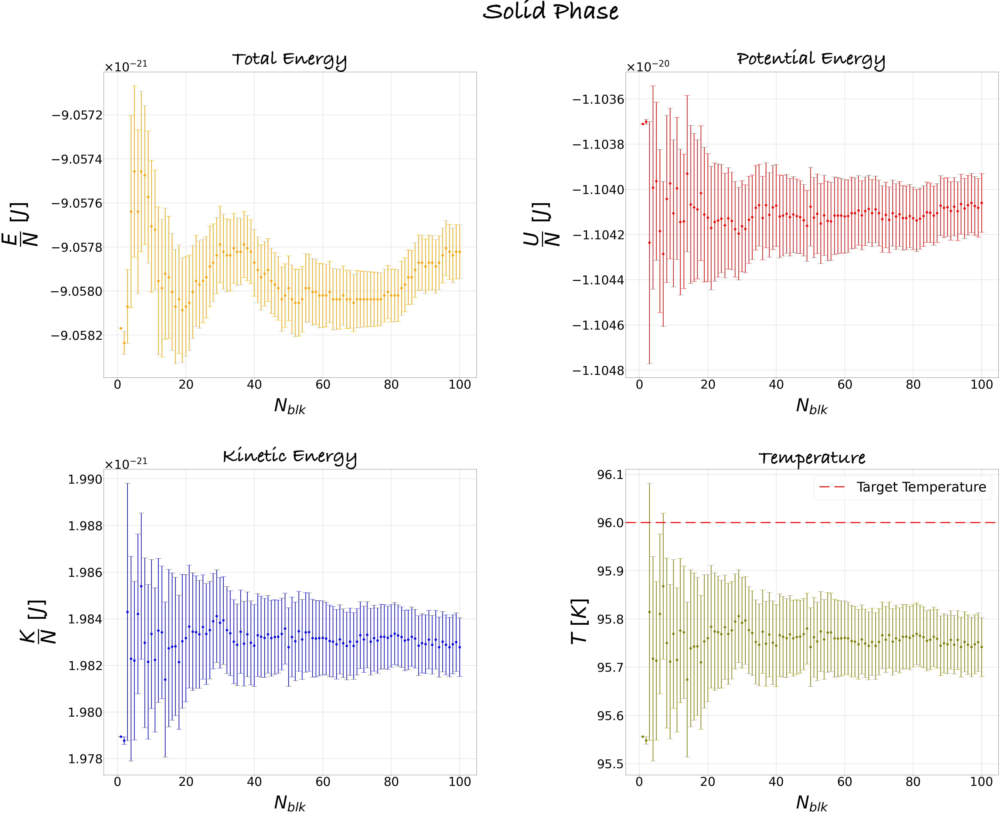

In [8]:
######################################
#plots
######################################
###
#Solid Phase
###
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Solid Phase', fontname = 'Bradley Hand', fontsize=120)

#Total Energy
ax1=plt.subplot(2, 2, 1)
plt.title('Total Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{E}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax1.ticklabel_format(style='sci', useMathText=True)
ax1.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*solid_etot, yerr=unit_of_energy*solid_err_etot, fmt='o',
             elinewidth=3.0, color='orange', markersize=10, capsize=12)
plt.grid(True)

#Potential Energy
ax2=plt.subplot(2, 2, 2)
plt.title('Potential Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{U}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax2.ticklabel_format(style='sci', useMathText=True)
ax2.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*solid_epot, yerr=unit_of_energy*solid_err_epot, fmt='o',
             elinewidth=3.0, color='red', markersize=10, capsize=12)
plt.grid(True)

#Kinetic Energy
ax3=plt.subplot(2, 2, 3)
plt.title('Kinetic Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{K}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax3.ticklabel_format(style='sci', useMathText=True)
ax3.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*solid_ekin, yerr=unit_of_energy*solid_err_ekin, fmt='o',
             elinewidth=3.0, color='blue', markersize=10, capsize=12)
plt.grid(True)

#Temperature
ax4=plt.subplot(2, 2, 4)
plt.title('Temperature', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$T \ [K]$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.errorbar(N_blk, EPS*solid_temp, yerr=EPS*solid_err_temp, fmt='o', elinewidth=3.0,
             color='olive', markersize=10, capsize=12)
plt.axhline(y=EPS*T_solid, color='red', linewidth=4.5, linestyle='--',
            dashes=(10, 5), label='Target Temperature')
plt.grid(True)
plt.legend(fontsize=60, loc='best')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

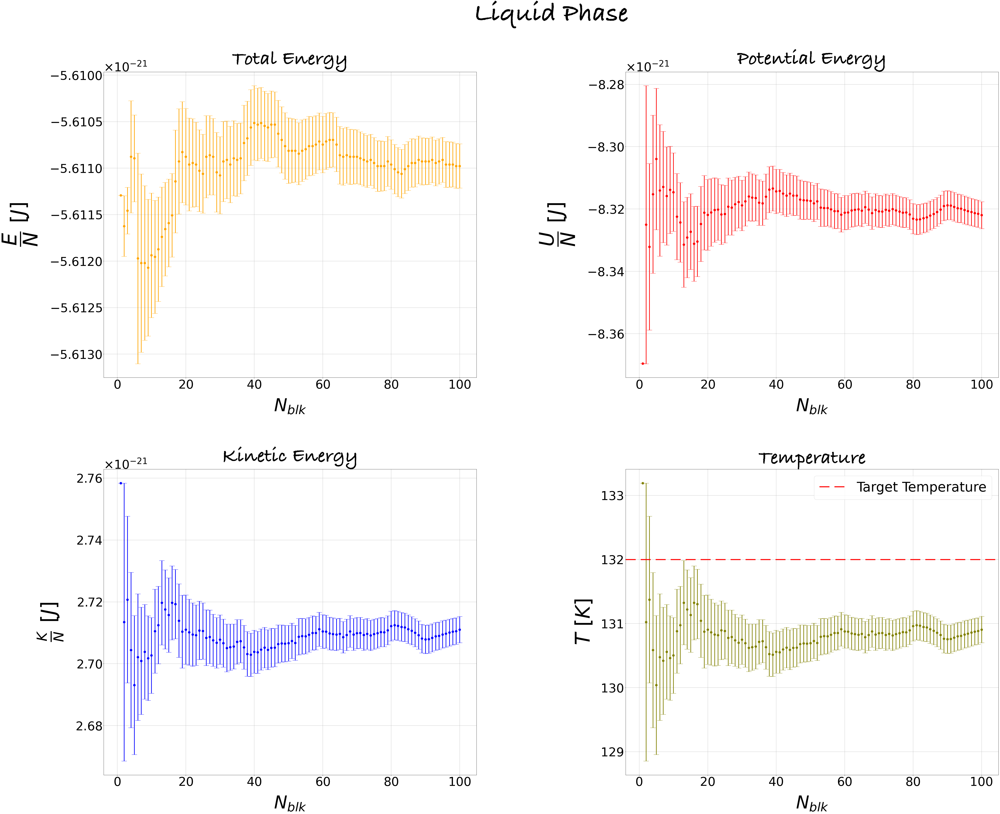

In [9]:
###
#Liquid Phase
###
print('\n\n')
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Liquid Phase', fontname = 'Bradley Hand', fontsize=120)

#Total Energy
ax1=plt.subplot(2, 2, 1)
plt.title('Total Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{E}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax1.ticklabel_format(style='sci', useMathText=True)
ax1.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*liquid_etot, yerr=unit_of_energy*liquid_err_etot, fmt='o',
             elinewidth=3.0, color='orange', markersize=10, capsize=12)
plt.grid(True)

#Potential Energy
ax2=plt.subplot(2, 2, 2)
plt.title('Potential Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{U}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax2.ticklabel_format(style='sci', useMathText=True)
ax2.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*liquid_epot, yerr=unit_of_energy*liquid_err_epot, fmt='o',
             elinewidth=3.0, color='red', markersize=10, capsize=12)
plt.grid(True)

#Kinetic Energy
ax3=plt.subplot(2, 2, 3)
plt.title('Kinetic Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\\frac{K}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax3.ticklabel_format(style='sci', useMathText=True)
ax3.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*liquid_ekin, yerr=unit_of_energy*liquid_err_ekin, fmt='o',
             elinewidth=3.0, color='blue', markersize=10, capsize=12)
plt.grid(True)

#Temperature
plt.subplot(2, 2, 4)
plt.title('Temperature', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$T \ [K]$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.errorbar(N_blk, EPS*liquid_temp, yerr=EPS*liquid_err_temp, fmt='o', elinewidth=3.0,
             color='olive', markersize=10, capsize=12)
plt.axhline(y=EPS*T_liquid, color='red', linewidth=4.5, linestyle='--',
            dashes=(10, 5), label='Target Temperature')
plt.grid(True)
plt.legend(fontsize=60, loc='best')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

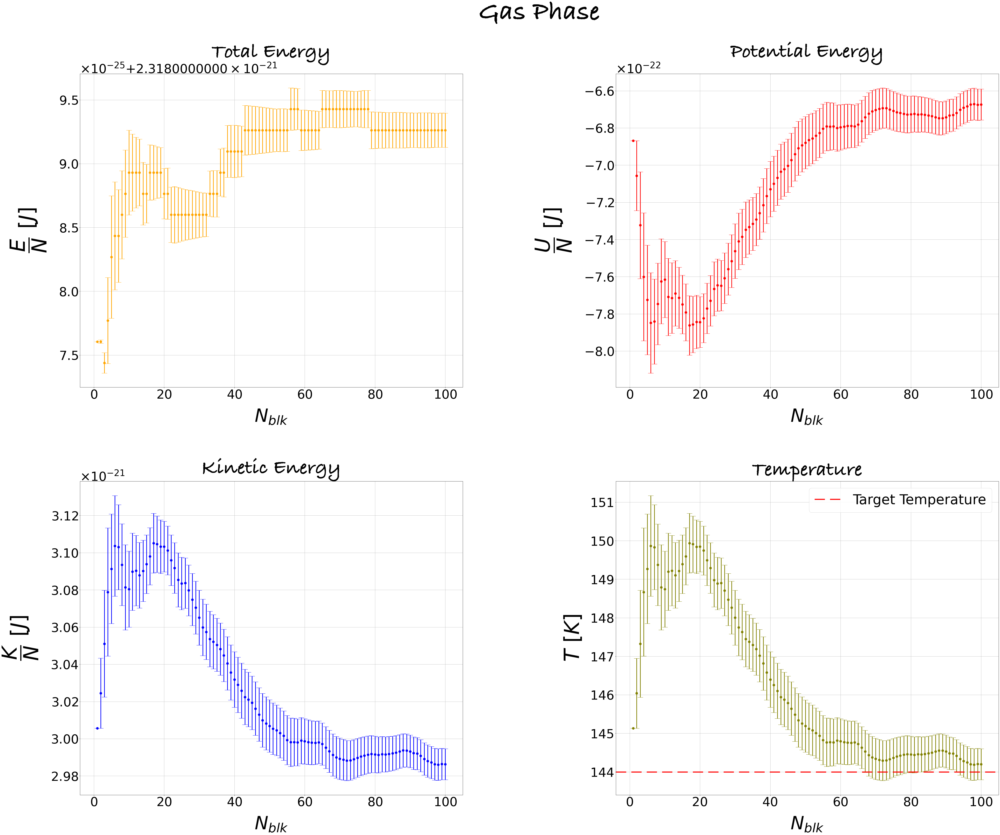

In [10]:
###
#Gas Phase
###
print('\n\n')
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Gas Phase', fontname = 'Bradley Hand', fontsize=120)

#Total Energy
ax1=plt.subplot(2, 2, 1)
plt.title('Total Energy', y=1.05, fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{E}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax1.ticklabel_format(style='sci', useMathText=True)
ax1.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*gas_etot, yerr=unit_of_energy*gas_err_etot, fmt='o',
             elinewidth=3.0, color='orange', markersize=10, capsize=12)
plt.grid(True)

#Potential Energy
ax2=plt.subplot(2, 2, 2)
plt.title('Potential Energy', y=1.05, fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{U}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax2.ticklabel_format(style='sci', useMathText=True)
ax2.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*gas_epot, yerr=unit_of_energy*gas_err_epot, fmt='o',
             elinewidth=3.0, color='red', markersize=10, capsize=12)
plt.grid(True)

#Kinetic Energy
ax3=plt.subplot(2, 2, 3)
plt.title('Kinetic Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{K}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax3.ticklabel_format(style='sci', useMathText=True)
ax3.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*gas_ekin, yerr=unit_of_energy*gas_err_ekin, fmt='o',
             elinewidth=3.0, color='blue', markersize=10, capsize=12)
plt.grid(True)

#Temperature
plt.subplot(2, 2, 4)
plt.title('Temperature', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$T \ [K]$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.errorbar(N_blk, EPS*gas_temp, yerr=EPS*gas_err_temp, fmt='o', elinewidth=3.0,
             color='olive', markersize=10, capsize=12)
plt.axhline(y=EPS*T_gas, color='red', linewidth=4.5, linestyle='--',
            dashes=(10, 5), label='Target Temperature')
plt.grid(True)
plt.legend(fontsize=60, loc='best')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

The results obtained satisfy me enough: all the three phases of Argon are sufficiently balanced at the simulation temperature, and the values obtained for potential and kinetic energies are meaningful; in fact, the solid, which seems to be the easiest system to study, is characterized by a large potential energy and a small kinetic energy compared to the other two phases, due to the crystalline structure in which the atoms are located; on the other hand, the high kinetic energy gas phase is the most chaotic thermodynamic condition and for this reason the curves related to the observables plotted in the graphs above are more fluctuating. <br>

I try to improve my estimates by scaling by an order of magnitude the time step during the integration of motion: now I take 

$$ \delta t \sim 0.108 \ fs $$

Decreasing the time interval between two successive data points, I decide to increase the total number of integration steps, in order to better control the correlations. <br>
I choose $ N_{step} = 10^6 $ and $ N_{blk} = 10^2 $. <br>
I show below the plots inherent to the evolution of the temperature in the three phases during the equilibration with these new parameters, and the estimates made after having brought the system to the thermodynamic equilibrium of interest.

In [11]:
######################################
#load the data
######################################
nsteps_dt=10**6
t_dt=np.linspace(1, nsteps_dt, num=nsteps_dt)

#Temperature
#Istantaneous values
temp_solid_dt=np.loadtxt("04.3/dt_reduced/solid/output_temp.dat")
temp_liquid_dt=np.loadtxt("04.3/dt_reduced/liquid/output_temp.dat")
temp_gas_dt=np.loadtxt("04.3/dt_reduced/gas/output_temp.dat")

#Blocks averages
solid_epot_dt, solid_err_epot_dt=np.loadtxt("04.3/dt_reduced/solid/ave_epot.dat", usecols=(0,1), unpack=True)
solid_ekin_dt, solid_err_ekin_dt=np.loadtxt("04.3/dt_reduced/solid/ave_ekin.dat", usecols=(0,1), unpack=True)
solid_etot_dt, solid_err_etot_dt=np.loadtxt("04.3/dt_reduced/solid/ave_etot.dat", usecols=(0,1), unpack=True)
solid_temp_dt, solid_err_temp_dt=np.loadtxt("04.3/dt_reduced/solid/ave_temp.dat", usecols=(0,1), unpack=True)

liquid_epot_dt, liquid_err_epot_dt=np.loadtxt("04.3/dt_reduced/liquid/ave_epot.dat", usecols=(0,1), unpack=True)
liquid_ekin_dt, liquid_err_ekin_dt=np.loadtxt("04.3/dt_reduced/liquid/ave_ekin.dat", usecols=(0,1), unpack=True)
liquid_etot_dt, liquid_err_etot_dt=np.loadtxt("04.3/dt_reduced/liquid/ave_etot.dat", usecols=(0,1), unpack=True)
liquid_temp_dt, liquid_err_temp_dt=np.loadtxt("04.3/dt_reduced/liquid/ave_temp.dat", usecols=(0,1), unpack=True)

gas_epot_dt, gas_err_epot_dt=np.loadtxt("04.3/dt_reduced/gas/ave_epot.dat", usecols=(0,1), unpack=True)
gas_ekin_dt, gas_err_ekin_dt=np.loadtxt("04.3/dt_reduced/gas/ave_ekin.dat", usecols=(0,1), unpack=True) 
gas_etot_dt, gas_err_etot_dt=np.loadtxt("04.3/dt_reduced/gas/ave_etot.dat", usecols=(0,1), unpack=True)
gas_temp_dt, gas_err_temp_dt=np.loadtxt("04.3/dt_reduced/gas/ave_temp.dat", usecols=(0,1), unpack=True)

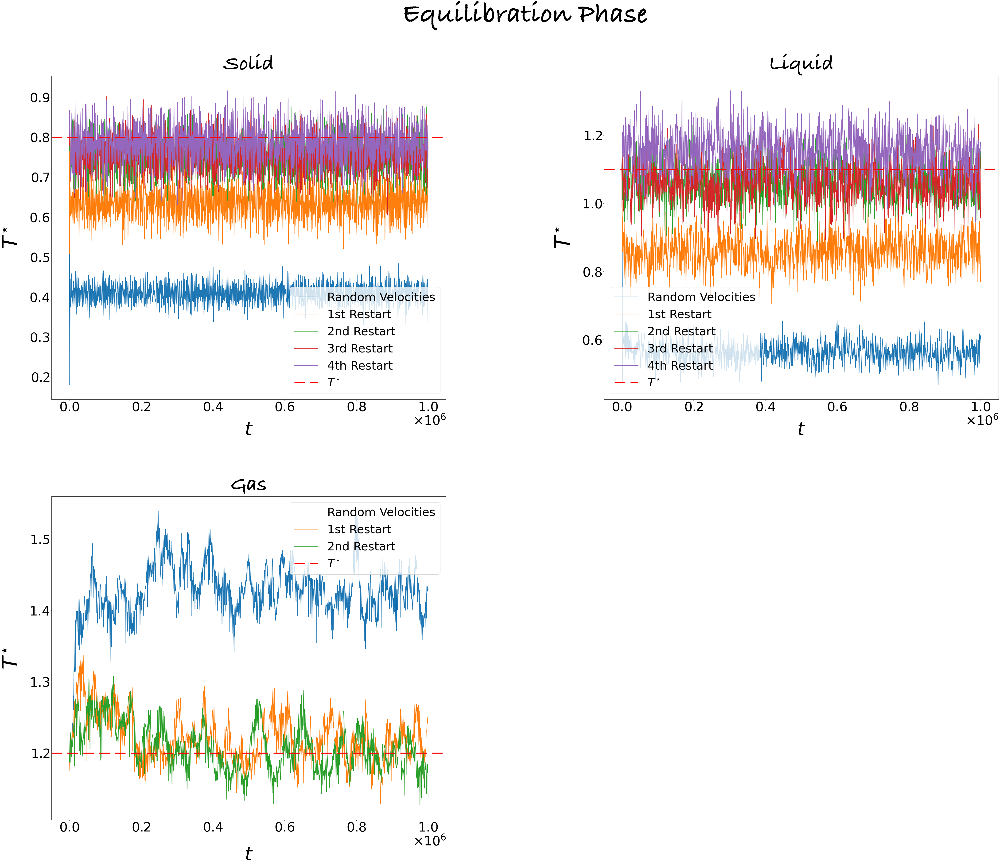

In [12]:
######################################
#plots
######################################
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Equilibration Phase', fontname = 'Bradley Hand', fontsize=120)

ax1=plt.subplot(2, 2, 1)
plt.title('Solid', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t_dt, temp_solid_dt[0:nsteps_dt], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t_dt, temp_solid_dt[nsteps_dt:2*nsteps_dt], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t_dt, temp_solid_dt[2*nsteps_dt:3*nsteps_dt], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t_dt, temp_solid_dt[3*nsteps_dt:4*nsteps_dt], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t_dt, temp_solid_dt[4*nsteps_dt:5*nsteps_dt], linestyle='-', lw=2.5, label='4th Restart')
plt.axhline(y=T_solid, color='r', linewidth=4.5, linestyle='--', dashes=(10, 5), label='$ T^{\star} $')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$T^{\star}$', fontsize=90, labelpad=30)
ax1.ticklabel_format(style='sci', useMathText=True)
ax1.xaxis.get_offset_text().set_fontsize(55)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.legend(fontsize=50, loc='lower right')

ax2=plt.subplot(2, 2, 2)
plt.title('Liquid', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t_dt, temp_liquid_dt[0:nsteps_dt], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t_dt, temp_liquid_dt[nsteps_dt:2*nsteps_dt], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t_dt, temp_liquid_dt[2*nsteps_dt:3*nsteps_dt], linestyle='-', lw=2.5, label='2nd Restart')
plt.plot(t_dt, temp_liquid_dt[3*nsteps_dt:4*nsteps_dt], linestyle='-', lw=2.5, label='3rd Restart')
plt.plot(t_dt, temp_liquid_dt[4*nsteps_dt:5*nsteps_dt], linestyle='-', lw=2.5, label='4th Restart')
plt.axhline(y=T_liquid, color='r', linewidth=4.5, linestyle='--', dashes=(10, 5), label='$ T^{\star} $')
plt.xlabel('$t$', fontsize=80, labelpad=30)
plt.ylabel('$T^{\star}$', fontsize=90, labelpad=30)
ax2.ticklabel_format(style='sci', useMathText=True)
ax2.xaxis.get_offset_text().set_fontsize(55)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.legend(fontsize=50, loc='best')

ax3=plt.subplot(2, 2, 3)
plt.title('Gas', fontname = 'Bradley Hand', fontsize=90)
plt.plot(t_dt, temp_gas_dt[0:nsteps_dt], linestyle='-', lw=2.5, label='Random Velocities')
plt.plot(t_dt, temp_gas_dt[nsteps_dt:2*nsteps_dt], linestyle='-', lw=2.5, label='1st Restart')
plt.plot(t_dt, temp_gas_dt[2*nsteps_dt:3*nsteps_dt], linestyle='-', lw=2.5, label='2nd Restart')
plt.axhline(y=T_gas, color='r', linewidth=4.5, linestyle='--', dashes=(10, 5), label='$ T^{\star} $')
plt.xlabel('$t$', fontsize=80, labelpad=50)
plt.ylabel('$T^{\star}$', fontsize=90, labelpad=30)
ax3.ticklabel_format(style='sci', useMathText=True)
ax3.xaxis.get_offset_text().set_fontsize(55)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.legend(fontsize=50, loc='upper right')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

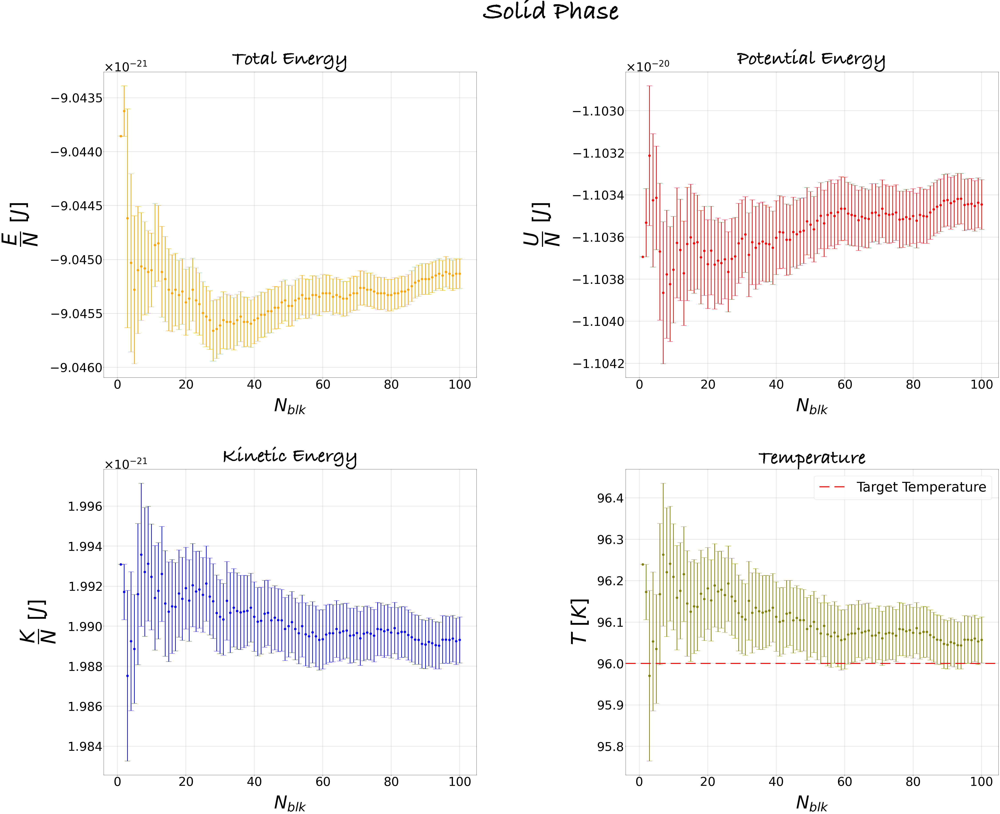

In [13]:
######################################
#plots
######################################
###
#Solid Phase
###
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Solid Phase', fontname = 'Bradley Hand', fontsize=120)

#Total Energy
ax1=plt.subplot(2, 2, 1)
plt.title('Total Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{E}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax1.ticklabel_format(style='sci', useMathText=True)
ax1.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*solid_etot_dt, yerr=unit_of_energy*solid_err_etot_dt, fmt='o',
             elinewidth=3.0, color='orange', markersize=10, capsize=12)
plt.grid(True)

#Potential Energy
ax2=plt.subplot(2, 2, 2)
plt.title('Potential Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{U}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax2.ticklabel_format(style='sci', useMathText=True)
ax2.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*solid_epot_dt, yerr=unit_of_energy*solid_err_epot_dt, fmt='o',
             elinewidth=3.0, color='red', markersize=10, capsize=12)
plt.grid(True)

#Kinetic Energy
ax3=plt.subplot(2, 2, 3)
plt.title('Kinetic Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{K}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax3.ticklabel_format(style='sci', useMathText=True)
ax3.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*solid_ekin_dt, yerr=unit_of_energy*solid_err_ekin_dt, fmt='o',
             elinewidth=3.0, color='blue', markersize=10, capsize=12)
plt.grid(True)

#Temperature
ax4=plt.subplot(2, 2, 4)
plt.title('Temperature', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$T \ [K]$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.errorbar(N_blk, EPS*solid_temp_dt, yerr=EPS*solid_err_temp_dt, fmt='o', elinewidth=3.0,
             color='olive', markersize=10, capsize=12)
plt.axhline(y=EPS*T_solid, color='red', linewidth=4.5, linestyle='--',
            dashes=(10, 5), label='Target Temperature')
plt.grid(True)
plt.legend(fontsize=60, loc='best')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

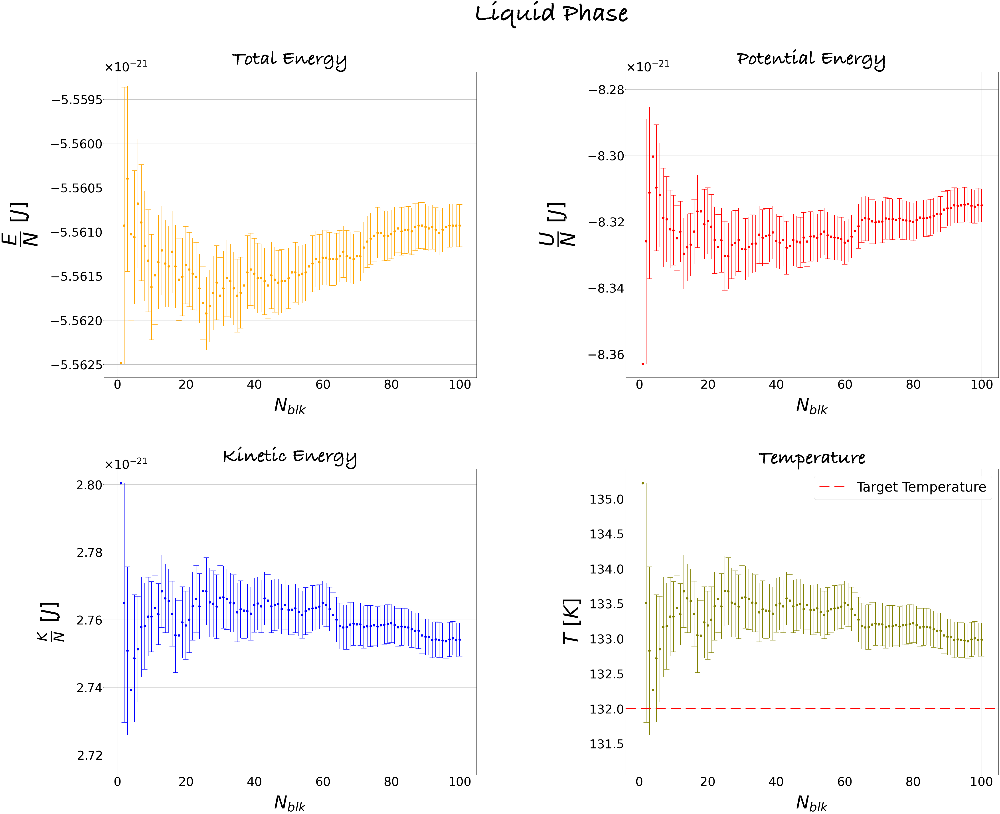

In [14]:
###
#Liquid Phase
###
print('\n\n')
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Liquid Phase', fontname = 'Bradley Hand', fontsize=120)

#Total Energy
ax1=plt.subplot(2, 2, 1)
plt.title('Total Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{E}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax1.ticklabel_format(style='sci', useMathText=True)
ax1.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*liquid_etot_dt, yerr=unit_of_energy*liquid_err_etot_dt, fmt='o',
             elinewidth=3.0, color='orange', markersize=10, capsize=12)
plt.grid(True)

#Potential Energy
ax2=plt.subplot(2, 2, 2)
plt.title('Potential Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{U}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax2.ticklabel_format(style='sci', useMathText=True)
ax2.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*liquid_epot_dt, yerr=unit_of_energy*liquid_err_epot_dt, fmt='o',
             elinewidth=3.0, color='red', markersize=10, capsize=12)
plt.grid(True)

#Kinetic Energy
ax3=plt.subplot(2, 2, 3)
plt.title('Kinetic Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\\frac{K}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax3.ticklabel_format(style='sci', useMathText=True)
ax3.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*liquid_ekin_dt, yerr=unit_of_energy*liquid_err_ekin_dt, fmt='o',
             elinewidth=3.0, color='blue', markersize=10, capsize=12)
plt.grid(True)

#Temperature
plt.subplot(2, 2, 4)
plt.title('Temperature', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$T \ [K]$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.errorbar(N_blk, EPS*liquid_temp_dt, yerr=EPS*liquid_err_temp_dt, fmt='o', elinewidth=3.0,
             color='olive', markersize=10, capsize=12)
plt.axhline(y=EPS*T_liquid, color='red', linewidth=4.5, linestyle='--',
            dashes=(10, 5), label='Target Temperature')
plt.grid(True)
plt.legend(fontsize=60, loc='best')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

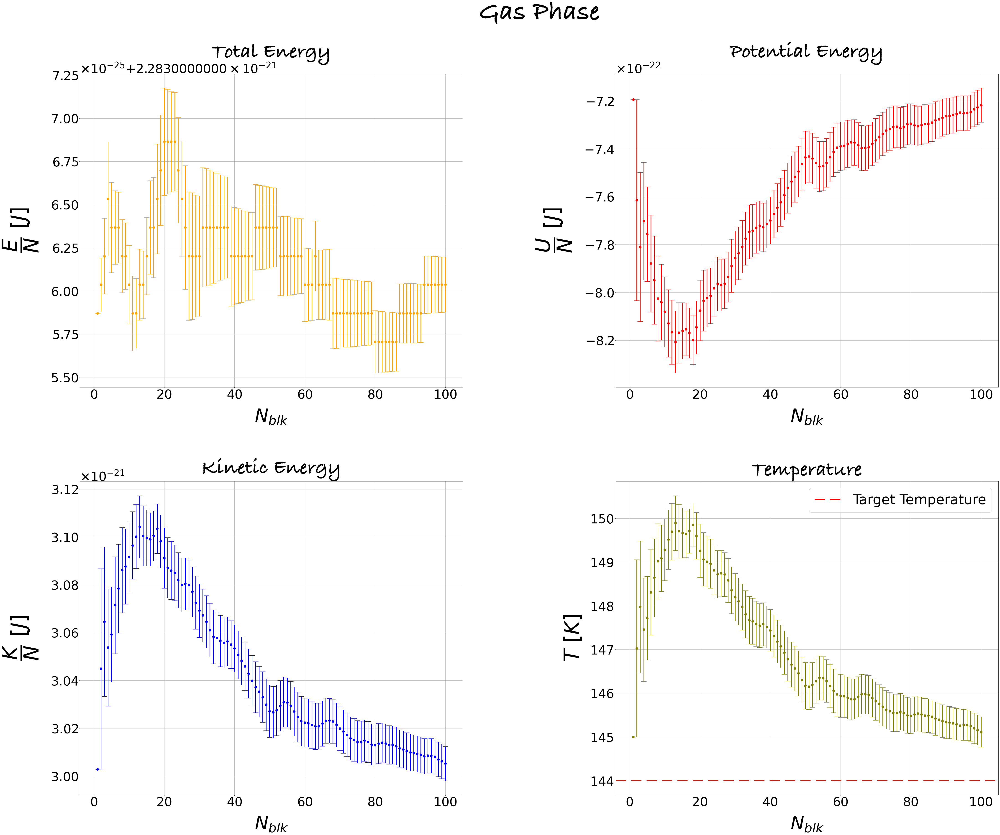

In [15]:
###
#Gas Phase
###
print('\n\n')
plt.figure(figsize=[70, 55]) #deafult (6.4,4.8)
plt.suptitle('Gas Phase', fontname = 'Bradley Hand', fontsize=120)

#Total Energy
ax1=plt.subplot(2, 2, 1)
plt.title('Total Energy', y=1.05, fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{E}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax1.ticklabel_format(style='sci', useMathText=True)
ax1.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*gas_etot_dt, yerr=unit_of_energy*gas_err_etot_dt, fmt='o',
             elinewidth=3.0, color='orange', markersize=10, capsize=12)
plt.grid(True)

#Potential Energy
ax2=plt.subplot(2, 2, 2)
plt.title('Potential Energy', y=1.05, fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{U}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax2.ticklabel_format(style='sci', useMathText=True)
ax2.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*gas_epot_dt, yerr=unit_of_energy*gas_err_epot_dt, fmt='o',
             elinewidth=3.0, color='red', markersize=10, capsize=12)
plt.grid(True)

#Kinetic Energy
ax3=plt.subplot(2, 2, 3)
plt.title('Kinetic Energy', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$\dfrac{K}{N} \ [J]$', fontsize=90, labelpad=50)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
ax3.ticklabel_format(style='sci', useMathText=True)
ax3.yaxis.get_offset_text().set_fontsize(55)
plt.errorbar(N_blk, unit_of_energy*gas_ekin_dt, yerr=unit_of_energy*gas_err_ekin_dt, fmt='o',
             elinewidth=3.0, color='blue', markersize=10, capsize=12)
plt.grid(True)

#Temperature
plt.subplot(2, 2, 4)
plt.title('Temperature', fontname = 'Bradley Hand', fontsize=90)
plt.xlabel('$N_{blk}$', fontsize=80, labelpad=30)
plt.ylabel('$T \ [K]$', fontsize=90, labelpad=30)
plt.xticks(fontsize=55)
plt.yticks(fontsize=55)
plt.errorbar(N_blk, EPS*gas_temp_dt, yerr=EPS*gas_err_temp_dt, fmt='o', elinewidth=3.0,
             color='olive', markersize=10, capsize=12)
plt.axhline(y=EPS*T_gas, color='red', linewidth=4.5, linestyle='--',
            dashes=(10, 5), label='Target Temperature')
plt.grid(True)
plt.legend(fontsize=60, loc='best')

plt.subplots_adjust(left=0.1, bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.3)
plt.show()

Reducing $ \delta_t $ as described above I get slightly better results for the solid and the liquid phases, which seem somewhat better equilibrated; in the case of the gas, the estimates obtained previously with a larger time step convince me more instead. <br>
In conclusion, the simulations I have described above as more satisfactory will be those that I will use in <font color='orange'>Numerical Exercise 7</font> as a comparison with the *Monte Carlo* methods.